In [1]:
import pandas as pd
import os
import numpy as np #Math library
import seaborn as sns #Graph library that use matplot in background
import matplotlib.pyplot as plt #to plot some parameters in seaborn

In [2]:
import plotly.offline as py 
py.init_notebook_mode(connected=True) # this code will allow us to work with offline plotly version
import plotly.graph_objs as go # it's like "plt" of matplot
import plotly.tools as tls # It's useful to we get some tools of plotly
import warnings # This library will be used to ignore some warnings
from collections import Counter # To do counter of some features
import plotly.io as pio

## Ingest the loan dataset to be analyzed and sample the top 5 rows

In [3]:
df = pd.read_csv("loan\loan.csv")
df.head()

C:\Users\raman\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3457: DtypeWarning:

Columns (47) have mixed types.Specify dtype option on import or set low_memory=False.



,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


## Evaluate the total number of records in the dataset

In [4]:
df.shape

(39717, 111)

## Formulate an understanding of the loan amount column

In [5]:
df['loan_amnt'].describe()

count    39717.000000
mean     11219.443815
std       7456.670694
min        500.000000
25%       5500.000000
50%      10000.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64

## Review the attribute names in the dataset

In [6]:
df.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       ...
       'num_tl_90g_dpd_24m', 'num_tl_op_past_12m', 'pct_tl_nvr_dlq',
       'percent_bc_gt_75', 'pub_rec_bankruptcies', 'tax_liens',
       'tot_hi_cred_lim', 'total_bal_ex_mort', 'total_bc_limit',
       'total_il_high_credit_limit'],
      dtype='object', length=111)

In [7]:
set(df)

{'acc_now_delinq',
 'acc_open_past_24mths',
 'addr_state',
 'all_util',
 'annual_inc',
 'annual_inc_joint',
 'application_type',
 'avg_cur_bal',
 'bc_open_to_buy',
 'bc_util',
 'chargeoff_within_12_mths',
 'collection_recovery_fee',
 'collections_12_mths_ex_med',
 'delinq_2yrs',
 'delinq_amnt',
 'desc',
 'dti',
 'dti_joint',
 'earliest_cr_line',
 'emp_length',
 'emp_title',
 'funded_amnt',
 'funded_amnt_inv',
 'grade',
 'home_ownership',
 'id',
 'il_util',
 'initial_list_status',
 'inq_fi',
 'inq_last_12m',
 'inq_last_6mths',
 'installment',
 'int_rate',
 'issue_d',
 'last_credit_pull_d',
 'last_pymnt_amnt',
 'last_pymnt_d',
 'loan_amnt',
 'loan_status',
 'max_bal_bc',
 'member_id',
 'mo_sin_old_il_acct',
 'mo_sin_old_rev_tl_op',
 'mo_sin_rcnt_rev_tl_op',
 'mo_sin_rcnt_tl',
 'mort_acc',
 'mths_since_last_delinq',
 'mths_since_last_major_derog',
 'mths_since_last_record',
 'mths_since_rcnt_il',
 'mths_since_recent_bc',
 'mths_since_recent_bc_dlq',
 'mths_since_recent_inq',
 'mths_since_

## Observe the different loan status values

In [8]:
df['loan_status'].unique()

array(['Fully Paid', 'Charged Off', 'Current'], dtype=object)

In [9]:
df.groupby(['loan_status'])['member_id'].count()

loan_status
Charged Off     5627
Current         1140
Fully Paid     32950
Name: member_id, dtype: int64

## Visualize the distribution of records by loan status

In [10]:
tr0 = go.Bar(
            x = df[df["loan_status"]== 'Fully Paid']["loan_status"].value_counts().index.values,
            y = df[df["loan_status"]== 'Fully Paid']["loan_status"].value_counts().values,
            name='Loan Paid'
    )

tr1 = go.Bar(
            x = df[df["loan_status"]== 'Charged Off']["loan_status"].value_counts().index.values,
            y = df[df["loan_status"]== 'Charged Off']["loan_status"].value_counts().values,
            name='Loan Default'
    )

tr2 = go.Bar(
            x = df[df["loan_status"]== 'Current']["loan_status"].value_counts().index.values,
            y = df[df["loan_status"]== 'Current']["loan_status"].value_counts().values,
            name='Good Standing'
    )

data = [tr0, tr1, tr2]

layout = go.Layout(
    
)

layout = go.Layout(
    yaxis=dict(
        title='Count'
    ),
    xaxis=dict(
        title='Loan Status Variable'
    ),
    title='Loan Status distribution'
)

fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='grouped-bar')

In [11]:
df.isnull().values.any()

True

## Analyze possible values of home ownership

In [12]:
df['home_ownership'].unique()

array(['RENT', 'OWN', 'MORTGAGE', 'OTHER', 'NONE'], dtype=object)

In [13]:
df['home_ownership'].value_counts()

RENT        18899
MORTGAGE    17659
OWN          3058
OTHER          98
NONE            3
Name: home_ownership, dtype: int64

## Assess relationship between home ownership and loan status. Are there loan defaults associated with a certain home ownership category? No, the defaults are almost equally spread between people who rent and people who have an existing mortgage, though the count of defaults reduces with people who already own a property

<AxesSubplot:xlabel='loan_status,home_ownership'>

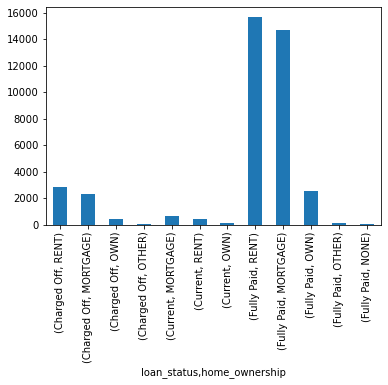

In [14]:
df.groupby(['loan_status'])['home_ownership'].value_counts().plot.bar()

## Possible values in accounts now delinquent to study it's relationship with loan status

In [15]:
df['acc_now_delinq'].value_counts()

0    39717
Name: acc_now_delinq, dtype: int64

## Study the relationship between application type & loan status  - All the applications in the dataset correspond to individual loans and there aren't any joint applicants

<AxesSubplot:xlabel='application_type,loan_status'>

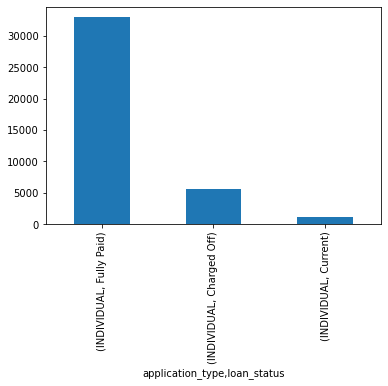

In [16]:
df.groupby(['application_type'])['loan_status'].value_counts().plot.bar()

In [17]:
df['dti'].describe()

count    39717.000000
mean        13.315130
std          6.678594
min          0.000000
25%          8.170000
50%         13.400000
75%         18.600000
max         29.990000
Name: dti, dtype: float64

In [18]:
df['dti'].isnull().sum()

0

<AxesSubplot:>

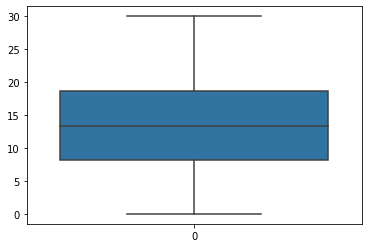

In [19]:
sns.boxplot(data=df['dti'])

In [20]:
df['int_rate'].isnull().sum()

0

## Remove special symbol (%) from the int_rate attribute for it to be treated as numeric 

In [21]:
df['int_rate'] = df['int_rate'].apply(lambda x: x[:-1])
df['int_rate'].value_counts()

10.99    956
13.49    826
11.49    825
7.51     787
7.88     725
        ... 
18.36      1
16.96      1
16.15      1
16.01      1
17.44      1
Name: int_rate, Length: 371, dtype: int64

In [22]:
df['int_rate'].astype(np.float64).describe()

count    39717.000000
mean        12.021177
std          3.724825
min          5.420000
25%          9.250000
50%         11.860000
75%         14.590000
max         24.590000
Name: int_rate, dtype: float64

In [23]:
df['int_rate'] = df['int_rate'].astype(np.float64)

## Plot the interest rates to assess density. The median is around 11.86 while the 75th percentile is around 14.59. There are few outliers beyond 22.5

<AxesSubplot:>

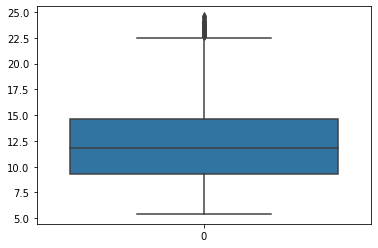

In [24]:
sns.boxplot(data=df['int_rate'])

## Plot the corelation amongst key numerical variables such as "debt to interest", funded amount, funded amount invested, loan amount and interest rates. The corelation analysis is segmented by loan status

In [25]:
new_df = df.groupby(['loan_status'])['dti','funded_amnt','funded_amnt_inv','int_rate','loan_amnt']
new_df.corr()

C:\Users\raman\AppData\Local\Temp/ipykernel_25504/3512726399.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



dti  funded_amnt  funded_amnt_inv  int_rate  \
loan_status                                                                     
Charged Off dti              1.000000     0.060861         0.072924  0.040607   
            funded_amnt      0.060861     1.000000         0.926996  0.353906   
            funded_amnt_inv  0.072924     0.926996         1.000000  0.369863   
            int_rate         0.040607     0.353906         0.369863  1.000000   
            loan_amnt        0.063872     0.979134         0.907129  0.351216   
Current     dti              1.000000     0.056264         0.056746 -0.023021   
            funded_amnt      0.056264     1.000000         0.995942  0.147691   
            funded_amnt_inv  0.056746     0.995942         1.000000  0.150430   
            int_rate        -0.023021     0.147691         0.150430  1.000000   
            loan_amnt        0.052573     0.967885         0.963360  0.153932   
Fully Paid  dti              1.000000     0.059677         0.068438  0.114644   
            funded_amnt      0.059677     1.000000         0.962434  0.290080   
            funded_amnt_inv  0.068438     0.962434         1.000000  0.282445   
            int_rate         0.114644     0.290080         0.282445  1.000000   
            loan_amnt        0.059256     0.982292         0.944587  0.285371   

                             loan_amnt  
loan_status                             
Charged Off dti               0.063872  
            funded_amnt       0.979134  
            funded_amnt_inv   0.907129  
            int_rate          0.351216  
            loan_amnt         1.000000  
Current     dti               0.052573  
            funded_amnt       0.967885  
            funded_amnt_inv   0.963360  
            int_rate          0.153932  
            loan_amnt         1.000000  
Fully Paid  dti               0.059256  
            funded_amnt       0.982292  
            funded_amnt_inv   0.944587  
            int_rate          0.285371  
            loan_amnt         1.000000

In [26]:
df['emp_length'].value_counts()

10+ years    8879
< 1 year     4583
2 years      4388
3 years      4095
4 years      3436
5 years      3282
1 year       3240
6 years      2229
7 years      1773
8 years      1479
9 years      1258
Name: emp_length, dtype: int64

## Analyze records that have an employment length of nulls

In [27]:
df[(df['emp_length'].isna())].groupby(['loan_status']).count()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
loan_status,,,,,,,,,,,,,,,,,,,,,
Charged Off,228,228,228,228,228,228,228,228,228,228,...,0,0,0,0,228,228,0,0,0,0
Current,42,42,42,42,42,42,42,42,42,42,...,0,0,0,0,42,42,0,0,0,0
Fully Paid,805,805,805,805,805,805,805,805,805,805,...,0,0,0,0,805,805,0,0,0,0


## Length of employment is a function of member (person availing the loan) and hence, imputing the value from other observations will induce skewness. Hence, we are choosing to clean up records with length of employment as nulls

In [28]:
df = df[~(df['emp_length'].isna())].reset_index()

## Record count post clean up

In [29]:
df.shape

(38642, 112)

## Function to segment length of employment into categorical buckets such as "Fresher", "Early, Mid & Late" Career

In [30]:
def create_emp_length_bucket(in_emp_length):
    if in_emp_length in ["< 1 year", "1 year"]:
        emp_length_bucket = "Fresher"
    elif in_emp_length in ["2 years", "3 years", "4 years","5 years"]:
        emp_length_bucket = "Early Career"         
    elif in_emp_length in ["6 years", "7 years", "8 years", "9 years"]:
        emp_length_bucket = "Mid Career"        
    else:
        emp_length_bucket = "Late Career"
      
    return emp_length_bucket

In [31]:
def cleanse_emp_length(in_emp_length):
    if in_emp_length in ["< 1 year", "1 year"]:
        emp_length_out = 1
    elif in_emp_length in ["2 years", "3 years", "4 years","5 years"]:
        emp_length_temp = in_emp_length.split()
        emp_length_out = int(emp_length_temp[0].strip())
        #print("emp length: ", emp_length_temp[0])
    elif in_emp_length in ["6 years", "7 years", "8 years", "9 years"]:
        emp_length_temp = in_emp_length.split()
        emp_length_out = int(emp_length_temp[0].strip())
    else:
        emp_length_out = 10
    
    return emp_length_out

In [32]:
df['emp_length_bucket'] = df['emp_length'].apply(lambda x: create_emp_length_bucket(x))

In [33]:
df['emp_length_bucket'].value_counts()

Early Career    15201
Late Career      8879
Fresher          7823
Mid Career       6739
Name: emp_length_bucket, dtype: int64

In [34]:
df['emp_length_new'] = df['emp_length'].apply(lambda x: cleanse_emp_length(x))

In [35]:
df.head()

,index,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,...,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,emp_length_bucket,emp_length_new
0,0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Late Career,10
1,1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Fresher,1
2,2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Late Career,10
3,3,1076863,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Late Career,10
4,4,1075358,1311748,3000,3000,3000.0,60 months,12.69,67.79,B,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Fresher,1


In [36]:
df[df["loan_status"]== 'Charged Off']["emp_length_bucket"].value_counts()

Early Career    2042
Late Career     1331
Fresher         1095
Mid Career       931
Name: emp_length_bucket, dtype: int64

## Analyze the relationship between buckets of employment vs loan status to see if there is a pattern for loan defaults

In [37]:
tr0 = go.Bar(
            x = df[df["loan_status"]== 'Fully Paid']["emp_length_bucket"].value_counts().index.values,
            y = df[df["loan_status"]== 'Fully Paid']["emp_length_bucket"].value_counts().values,
            name='Loan Paid'
    )

tr1 = go.Bar(
            x = df[df["loan_status"]== 'Charged Off']["emp_length_bucket"].value_counts().index.values,
            y = df[df["loan_status"]== 'Charged Off']["emp_length_bucket"].value_counts().values,
            name='Loan Default'
    )

tr2 = go.Bar(
            x = df[df["loan_status"]== 'Current']["emp_length_bucket"].value_counts().index.values,
            y = df[df["loan_status"]== 'Current']["emp_length_bucket"].value_counts().values,
            name='Good Standing'
    )

data = [tr0, tr1, tr2]

layout = go.Layout(
    
)

layout = go.Layout(
    yaxis=dict(
        title='Count'
    ),
    xaxis=dict(
        title='Length of Employment'
    ),
    title='Loan Status distribution by length of employment'
)

fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='emp-length-grouped-bar')

## Analyze the segments (employment bucket) against loan status as a ratio (%) of overall contribution.

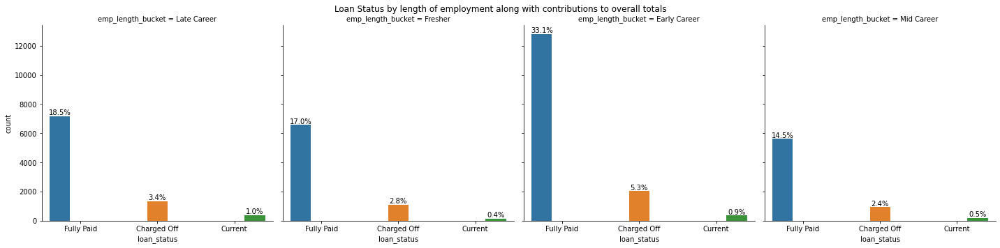

In [38]:
#identify the ratio of paid off vs good standing vs default loans by length of employment
fg = sns.catplot(data=df, kind='count', x='loan_status', hue='loan_status', col='emp_length_bucket')
fg.fig.subplots_adjust(top=0.9)
fg.fig.suptitle('Loan Status by length of employment along with contributions to overall totals')

for ax in fg.axes.ravel():
    
    for c in ax.containers:

        labels = [f'{h/df.loan_status.count()*100:0.1f}%' if (h := v.get_height()) > 0 else '' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')

plt.show()

In [39]:
df['funded_amnt_inv'].value_counts().sort_values(ascending=False)

5000.000000     1253
10000.000000    1235
6000.000000     1160
12000.000000    1054
8000.000000      870
                ... 
1574.995234        1
19142.161080       1
75.000000          1
499.999401         1
12413.591810       1
Name: funded_amnt_inv, Length: 8097, dtype: int64

## Box plot on amount funded by investors and median amount invested is 9000 while the 75th percentile is 14425. The outliers carry a value of over 25K

<AxesSubplot:>

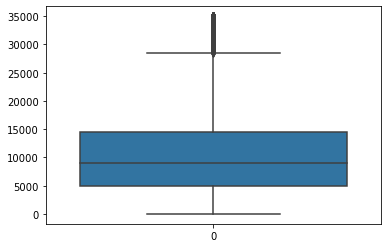

In [40]:
sns.boxplot(data=df['funded_amnt_inv'])

In [41]:
df['funded_amnt_inv'].describe()

count    38642.000000
mean     10455.452667
std       7139.613641
min          0.000000
25%       5000.000000
50%       9000.000000
75%      14425.000000
max      35000.000000
Name: funded_amnt_inv, dtype: float64

## Analyze records with funded amount invested as 0

In [42]:
df[(df['funded_amnt_inv'] == 0)]

,index,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,...,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,emp_length_bucket,emp_length_new
37313,38388,357380,363377,1775,1775,0.0,36 months,12.72,59.57,C,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Fresher,1
37317,38392,357157,362967,7500,7500,0.0,36 months,10.01,242.04,B,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Late Career,10
37318,38393,357066,362786,4000,4000,0.0,36 months,7.68,124.76,A,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Fresher,1
37321,38396,356699,362127,3200,2100,0.0,36 months,7.68,65.50,A,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Fresher,1
37322,38397,356601,361999,7500,7500,0.0,36 months,11.59,247.65,C,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Early Career,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37664,38739,338592,338545,7500,5600,0.0,36 months,8.00,175.49,A,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Early Career,2
37668,38743,343957,343953,6000,6000,0.0,36 months,10.08,193.83,B,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Fresher,1
37671,38746,330183,330122,7500,7500,0.0,36 months,11.03,245.65,C,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Fresher,1
37676,38751,342507,342490,7500,5300,0.0,36 months,10.08,171.22,B,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Early Career,2


In [43]:
df[(df['funded_amnt_inv'] == 0)].groupby(['loan_status'])['funded_amnt']

In [44]:
df['funded_amnt'].describe()

count    38642.000000
mean     11017.101211
std       7193.038828
min        500.000000
25%       5500.000000
50%       9950.000000
75%      15000.000000
max      35000.000000
Name: funded_amnt, dtype: float64

## Function to impute funded amount invested for records with 0's using funded amount attribute

In [45]:
def calcFinalAmnt(in_amnt):
    amnt_final = 0
    #print("Amnt invested: ", in_amnt[0])
    #print("Amnt funded: ", in_amnt[1])
    if in_amnt[0] == 0:
        amnt_final = in_amnt[1]
    else:
        amnt_final = in_amnt[0]
    return(amnt_final)

In [46]:
df['funded_amnt_inv_final'] = df[['funded_amnt_inv','funded_amnt']].apply(calcFinalAmnt,axis=1)

In [47]:
df[(df['funded_amnt_inv'] == 0)]

,index,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,...,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,emp_length_bucket,emp_length_new,funded_amnt_inv_final
37313,38388,357380,363377,1775,1775,0.0,36 months,12.72,59.57,C,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Fresher,1,1775.0
37317,38392,357157,362967,7500,7500,0.0,36 months,10.01,242.04,B,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Late Career,10,7500.0
37318,38393,357066,362786,4000,4000,0.0,36 months,7.68,124.76,A,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Fresher,1,4000.0
37321,38396,356699,362127,3200,2100,0.0,36 months,7.68,65.50,A,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Fresher,1,2100.0
37322,38397,356601,361999,7500,7500,0.0,36 months,11.59,247.65,C,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Early Career,2,7500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37664,38739,338592,338545,7500,5600,0.0,36 months,8.00,175.49,A,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Early Career,2,5600.0
37668,38743,343957,343953,6000,6000,0.0,36 months,10.08,193.83,B,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Fresher,1,6000.0
37671,38746,330183,330122,7500,7500,0.0,36 months,11.03,245.65,C,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Fresher,1,7500.0
37676,38751,342507,342490,7500,5300,0.0,36 months,10.08,171.22,B,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,Early Career,2,5300.0


In [48]:
df['funded_amnt_inv_final'].describe()

count    38642.000000
mean     10474.224341
std       7120.906547
min          0.000121
25%       5000.000000
50%       9000.000000
75%      14425.000000
max      35000.000000
Name: funded_amnt_inv_final, dtype: float64

## Plot the final (imputed) funded amount to observe median, 25th & 75th percentiles

<AxesSubplot:>

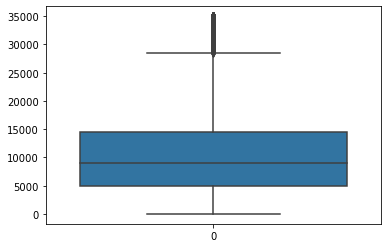

In [49]:
sns.boxplot(data=df['funded_amnt_inv_final'])

## Analyze possible values for loan term

In [50]:
df['term'].value_counts() #.index.values

 36 months    28287
 60 months    10355
Name: term, dtype: int64

In [51]:
df['term'].isnull().sum()

0

In [52]:
df['term'] = df['term'].apply(lambda x: str(x).strip())

In [53]:
df['term_bucket'] = df['term'].apply(lambda x: "Short term" if x == "36 months" else "Long term")

In [54]:
df['term_bucket'].value_counts()

Short term    28287
Long term     10355
Name: term_bucket, dtype: int64

## Analyze the relationship between term and loan status to assess if defaults are rampant in a particular type

In [55]:
#First plot
tr0 = go.Bar(
    x = df[df["loan_status"]== 'Fully Paid']["term_bucket"].value_counts().index.values,
    y = df[df["loan_status"]== 'Fully Paid']["term_bucket"].value_counts().values,
    name='Loan Paid'
)

#First plot 2
tr1 = go.Bar(
    x = df[df["loan_status"]== 'Charged Off']["term_bucket"].value_counts().index.values,
    y = df[df["loan_status"]== 'Charged Off']["term_bucket"].value_counts().values,
    name="Loan Default"
)

#Second plot
tr2 = go.Box(
    x = df[df["loan_status"]== 'Fully Paid']["term_bucket"],
    y = df[df["loan_status"]== 'Fully Paid']["funded_amnt_inv_final"],
    name=tr0.name
)

#Second plot 2
tr3 = go.Box(
    x = df[df["loan_status"]== 'Charged Off']["term_bucket"],
    y = df[df["loan_status"]== 'Charged Off']["funded_amnt_inv_final"],
    name=tr1.name
)

data = [tr0, tr1, tr2,tr3]


fig = tls.make_subplots(rows=1, cols=2, 
                        subplot_titles=('Term', 'Loan Amount by Term'))

fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 1)
fig.append_trace(tr2, 1, 2)
fig.append_trace(tr3, 1, 2)

fig['layout'].update(height=400, width=800, title='Term Distribution', boxmode='group')
py.iplot(fig, filename='term-subplot')

C:\Users\raman\anaconda3\lib\site-packages\plotly\tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



## Analyze the relationship between term, employment length against loan status & assess contributions

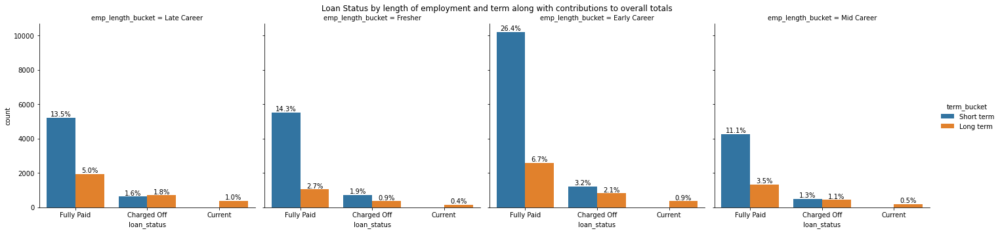

In [56]:
#identify the ratio of paid off vs good standing vs default loans by length of employment & term
fg = sns.catplot(data=df, kind='count', x='loan_status', hue='term_bucket', col='emp_length_bucket')
fg.fig.subplots_adjust(top=0.9)
fg.fig.suptitle('Loan Status by length of employment and term along with contributions to overall totals')

for ax in fg.axes.ravel():
    
    for c in ax.containers:

        labels = [f'{h/df.loan_status.count()*100:0.1f}%' if (h := v.get_height()) > 0 else '' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')

plt.show()

In [57]:
df.groupby(['loan_status','term_bucket'])['int_rate'].value_counts()

loan_status  term_bucket  int_rate
Charged Off  Long term    13.49       66
                          11.49       62
                          18.25       51
                          16.49       46
                          16.77       46
                                      ..
Fully Paid   Short term   20.53        1
                          20.69        1
                          21.28        1
                          22.06        1
                          23.22        1
Name: int_rate, Length: 1038, dtype: int64

In [58]:
#First plot
tr0 = go.Bar(
    x = df[df["loan_status"]== 'Fully Paid']["term_bucket"].value_counts().index.values,
    y = df[df["loan_status"]== 'Fully Paid']["term_bucket"].value_counts().values,
    name='Loan Paid'
)

#First plot 2
tr1 = go.Bar(
    x = df[df["loan_status"]== 'Charged Off']["term_bucket"].value_counts().index.values,
    y = df[df["loan_status"]== 'Charged Off']["term_bucket"].value_counts().values,
    name="Loan Default"
)

#Second plot
tr2 = go.Box(
    x = df[df["loan_status"]== 'Fully Paid']["term_bucket"],
    y = df[df["loan_status"]== 'Fully Paid']["int_rate"],
    name=tr0.name
)

#Second plot 2
tr3 = go.Box(
    x = df[df["loan_status"]== 'Charged Off']["term_bucket"],
    y = df[df["loan_status"]== 'Charged Off']["int_rate"],
    name=tr1.name
)

data = [tr0, tr1, tr2,tr3]


fig = tls.make_subplots(rows=1, cols=2, 
                        subplot_titles=('Term', 'Interest Rate by Term'))

fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 1)
fig.append_trace(tr2, 1, 2)
fig.append_trace(tr3, 1, 2)

fig['layout'].update(height=600, width=960, title='Loan Status: Term Distribution & Range of Interest Rates', boxmode='group')
py.iplot(fig, filename='termint-subplot')

C:\Users\raman\anaconda3\lib\site-packages\plotly\tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



## Create interest rate buckets

In [59]:
def calcIntBucket(in_int_rate):
    out_int_bucket = ""
    if int(round(in_int_rate)) in range(0,5):
        out_int_bucket = "Very Low"
    elif int(round(in_int_rate)) in range(5,10):
        out_int_bucket = "Low"
    elif int(round(in_int_rate)) in range(10,15):
        out_int_bucket = "Nominal"
    elif int(round(in_int_rate)) in range(15,20):
        out_int_bucket = "High"
    else:
        out_int_bucket = "Very High"
    return (out_int_bucket)
        

In [60]:
df['int_rate_bucket'] = df['int_rate'].apply(lambda x: calcIntBucket(x))

In [61]:
df['int_rate_bucket'].value_counts()

Nominal      18965
Low           9875
High          8697
Very High     1105
Name: int_rate_bucket, dtype: int64

## Analyze the relationship between term, interest rate against loan status & assess contributions

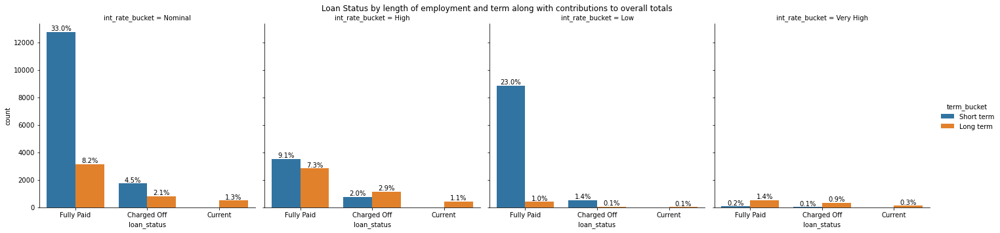

In [62]:
#identify the ratio of paid off vs good standing vs default loans by length of employment & term
fg = sns.catplot(data=df, kind='count', x='loan_status', hue='term_bucket', col='int_rate_bucket')
fg.fig.subplots_adjust(top=0.9)
fg.fig.suptitle('Loan Status by length of employment and term along with contributions to overall totals')

for ax in fg.axes.ravel():
    
    for c in ax.containers:

        labels = [f'{h/df.loan_status.count()*100:0.1f}%' if (h := v.get_height()) > 0 else '' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')

plt.show()

## Analyze the relationship between interest rate, loan amount and loan status

In [63]:
#First plot
tr0 = go.Bar(
    x = df[df["loan_status"]== 'Fully Paid']["int_rate_bucket"].value_counts().index.values,
    y = df[df["loan_status"]== 'Fully Paid']["int_rate_bucket"].value_counts().values,
    name='Loan Paid'
)

#First plot 2
tr1 = go.Bar(
    x = df[df["loan_status"]== 'Charged Off']["int_rate_bucket"].value_counts().index.values,
    y = df[df["loan_status"]== 'Charged Off']["int_rate_bucket"].value_counts().values,
    name="Loan Default"
)

#Second plot
tr2 = go.Box(
    x = df[df["loan_status"]== 'Fully Paid']["int_rate_bucket"],
    y = df[df["loan_status"]== 'Fully Paid']["funded_amnt_inv_final"],
    name=tr0.name
)

#Second plot 2
tr3 = go.Box(
    x = df[df["loan_status"]== 'Charged Off']["int_rate_bucket"],
    y = df[df["loan_status"]== 'Charged Off']["funded_amnt_inv_final"],
    name=tr1.name
)

data = [tr0, tr1, tr2,tr3]


fig = tls.make_subplots(rows=1, cols=2, 
                        subplot_titles=('Interest Rate', 'Loan Amount Invested by Interest Rate'))

fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 1)
fig.append_trace(tr2, 1, 2)
fig.append_trace(tr3, 1, 2)

fig['layout'].update(height=600, width=960, title='Loan Status: Interest Rate Distribution & Range of Amount Invested', boxmode='group')
py.iplot(fig, filename='intamount-subplot')

C:\Users\raman\anaconda3\lib\site-packages\plotly\tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



## Analyze the relationship between interest rate, employment length against loan status & assess contributions

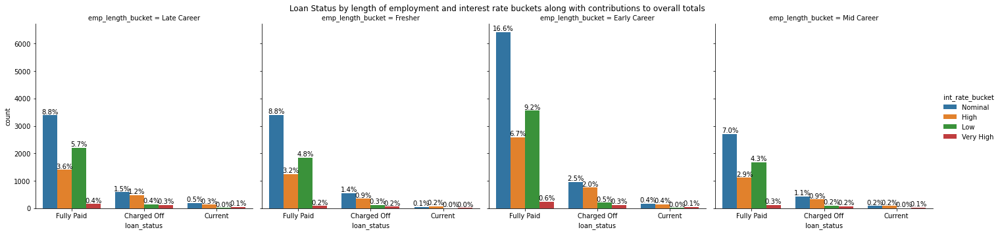

In [64]:
#identify the ratio of paid off vs good standing vs default loans by length of employment & term
fg = sns.catplot(data=df, kind='count', x='loan_status', hue='int_rate_bucket', col='emp_length_bucket')
fg.fig.subplots_adjust(top=0.9)
fg.fig.suptitle('Loan Status by length of employment and interest rate buckets along with contributions to overall totals')

for ax in fg.axes.ravel():
    
    for c in ax.containers:

        labels = [f'{h/df.loan_status.count()*100:0.1f}%' if (h := v.get_height()) > 0 else '' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')

plt.show()

In [65]:
df_paid = df[df["loan_status"]== 'Fully Paid']

In [66]:
df_default = df[df["loan_status"]== 'Charged Off']

## Analyze fully paid and default loans based on amount funded and interest rates

In [67]:
fig = {
    "data": [
        {
            "type": 'violin',
            "x": df_paid['int_rate_bucket'],
            "y": df_paid['funded_amnt_inv_final'],
            "legendgroup": 'Loan Paid',
            "scalegroup": 'No',
            "name": 'Loan Paid',
            "side": 'negative',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'green'
            }
        },
        {
            "type": 'violin',
            "x": df_default['int_rate_bucket'],
            "y": df_default['funded_amnt_inv_final'],
            "legendgroup": 'Loan Default',
            "scalegroup": 'No',
            "name": 'Loan Default',
            "side": 'positive',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'red'
            }
        }
    ],
    "layout" : {
        "yaxis": {
            "zeroline": False,
        },
        "violingap": 0,
        "violinmode": "overlay"
    }
}


py.iplot(fig, filename = 'violin plot', validate = False)

In [68]:
df['mort_acc'].isnull().sum()

38642

In [69]:
df['policy_code'].value_counts()

1    38642
Name: policy_code, dtype: int64

In [70]:
df['title'].value_counts()

Debt Consolidation             2144
Debt Consolidation Loan        1691
Personal Loan                   641
Consolidation                   511
debt consolidation              486
                               ... 
Shannon's personal loan           1
credit card finally gone!!!       1
Taxes 2011                        1
Dc                                1
JAL Loan                          1
Name: title, Length: 19148, dtype: int64

In [71]:
df['verification_status'].value_counts()

Not Verified       16498
Verified           12353
Source Verified     9791
Name: verification_status, dtype: int64

In [72]:
df['verification_status'].isnull().sum()

0

## Analyze the relationship between interest rate, income verification against loan status & assess contributions

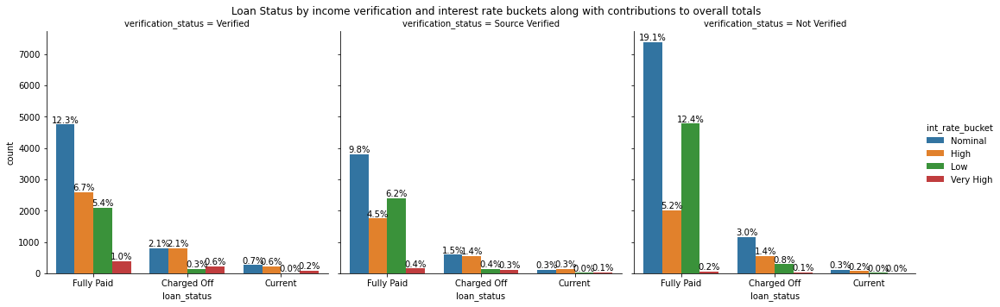

In [73]:
#identify the ratio of paid off vs good standing vs default loans by income verification status & interest bucket
fg = sns.catplot(data=df, kind='count', x='loan_status', hue='int_rate_bucket', col='verification_status')
fg.fig.subplots_adjust(top=0.9)
fg.fig.suptitle('Loan Status by income verification and interest rate buckets along with contributions to overall totals')

for ax in fg.axes.ravel():
    
    for c in ax.containers:

        labels = [f'{h/df.loan_status.count()*100:0.1f}%' if (h := v.get_height()) > 0 else '' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')

plt.show()

In [74]:
fig = {
    "data": [
        {
            "type": 'violin',
            "x": df_paid['verification_status'],
            "y": df_paid['funded_amnt_inv_final'],
            "legendgroup": 'Loan Paid',
            "scalegroup": 'No',
            "name": 'Loan Paid',
            "side": 'negative',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'green'
            }
        },
        {
            "type": 'violin',
            "x": df_default['verification_status'],
            "y": df_default['funded_amnt_inv_final'],
            "legendgroup": 'Loan Default',
            "scalegroup": 'No',
            "name": 'Loan Default',
            "side": 'positive',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'red'
            }
        }
    ],
    "layout" : {
        "yaxis": {
            "zeroline": False,
        },
        "violingap": 0,
        "violinmode": "overlay"
    }
}


py.iplot(fig, filename = 'violin plot1', validate = False)

## Analyze the strength of relationship between employment length, amount funded and interest rates by loan status

In [75]:
df_new_emp_length = df.groupby(['loan_status'])['emp_length_new','funded_amnt_inv_final','int_rate']
df_new_emp_length.corr()

C:\Users\raman\AppData\Local\Temp/ipykernel_25504/2410238275.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



emp_length_new  funded_amnt_inv_final  \
loan_status                                                                
Charged Off emp_length_new               1.000000               0.199194   
            funded_amnt_inv_final        0.199194               1.000000   
            int_rate                     0.041043               0.364140   
Current     emp_length_new               1.000000               0.167668   
            funded_amnt_inv_final        0.167668               1.000000   
            int_rate                    -0.040102               0.145984   
Fully Paid  emp_length_new               1.000000               0.150228   
            funded_amnt_inv_final        0.150228               1.000000   
            int_rate                    -0.012082               0.280867   

                                   int_rate  
loan_status                                  
Charged Off emp_length_new         0.041043  
            funded_amnt_inv_final  0.364140  
            int_rate               1.000000  
Current     emp_length_new        -0.040102  
            funded_amnt_inv_final  0.145984  
            int_rate               1.000000  
Fully Paid  emp_length_new        -0.012082  
            funded_amnt_inv_final  0.280867  
            int_rate               1.000000

In [76]:
df['grade'].value_counts()

B    11686
A     9695
C     7926
D     5195
E     2795
F     1030
G      315
Name: grade, dtype: int64

In [77]:
df['grade'].isnull().sum()

0

In [78]:
df['sub_grade'].value_counts()

B3    2835
A4    2803
A5    2658
B5    2646
B4    2461
C1    2092
B2    1991
C2    1978
B1    1753
A3    1741
C3    1496
A2    1441
D2    1317
C4    1206
C5    1154
D3    1146
A1    1052
D4     963
D1     916
D5     853
E1     750
E2     646
E3     540
E4     449
E5     410
F1     325
F2     244
F3     182
F4     164
F5     115
G1     103
G2      78
G4      56
G3      48
G5      30
Name: sub_grade, dtype: int64

In [79]:
df['sub_grade'].isnull().sum()

0

## Analyze the strength of relationship between grade and amount funded by loan status

In [80]:
#First plot
tr0 = go.Bar(
    x = df[df["loan_status"]== 'Fully Paid']["grade"].value_counts().index.values,
    y = df[df["loan_status"]== 'Fully Paid']["grade"].value_counts().values,
    name='Loan Paid'
)

#First plot 2
tr1 = go.Bar(
    x = df[df["loan_status"]== 'Charged Off']["grade"].value_counts().index.values,
    y = df[df["loan_status"]== 'Charged Off']["grade"].value_counts().values,
    name="Loan Default"
)

#Second plot
tr2 = go.Box(
    x = df[df["loan_status"]== 'Fully Paid']["grade"],
    y = df[df["loan_status"]== 'Fully Paid']["funded_amnt_inv_final"],
    name=tr0.name
)

#Second plot 2
tr3 = go.Box(
    x = df[df["loan_status"]== 'Charged Off']["grade"],
    y = df[df["loan_status"]== 'Charged Off']["funded_amnt_inv_final"],
    name=tr1.name
)

data = [tr0, tr1, tr2,tr3]


fig = tls.make_subplots(rows=1, cols=2, 
                        subplot_titles=('Grade', 'Loan Amount Invested by Grade'))

fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 1)
fig.append_trace(tr2, 1, 2)
fig.append_trace(tr3, 1, 2)

fig['layout'].update(height=600, width=960, title='Loan Status: Grade Distribution & Range of Amount Invested', boxmode='group')
py.iplot(fig, filename='gradeamount-subplot')

C:\Users\raman\anaconda3\lib\site-packages\plotly\tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



## Analyze the grade distribution and interest rates by loan status

In [81]:
#First plot
tr0 = go.Bar(
    x = df[df["loan_status"]== 'Fully Paid']["grade"].value_counts().index.values,
    y = df[df["loan_status"]== 'Fully Paid']["grade"].value_counts().values,
    name='Loan Paid'
)

#First plot 2
tr1 = go.Bar(
    x = df[df["loan_status"]== 'Charged Off']["grade"].value_counts().index.values,
    y = df[df["loan_status"]== 'Charged Off']["grade"].value_counts().values,
    name="Loan Default"
)

#Second plot
tr2 = go.Box(
    x = df[df["loan_status"]== 'Fully Paid']["grade"],
    y = df[df["loan_status"]== 'Fully Paid']["int_rate"],
    name=tr0.name
)

#Second plot 2
tr3 = go.Box(
    x = df[df["loan_status"]== 'Charged Off']["grade"],
    y = df[df["loan_status"]== 'Charged Off']["int_rate"],
    name=tr1.name
)

data = [tr0, tr1, tr2,tr3]


fig = tls.make_subplots(rows=1, cols=2, 
                        subplot_titles=('Grade', 'Interest Rate by Grade'))

fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 1)
fig.append_trace(tr2, 1, 2)
fig.append_trace(tr3, 1, 2)

fig['layout'].update(height=600, width=960, title='Loan Status: Grade Distribution & Range of Interest Rates', boxmode='group')
py.iplot(fig, filename='gradeintrate-subplot')

In [82]:
fig = {
    "data": [
        {
            "type": 'violin',
            "x": df_paid['grade'],
            "y": df_paid['funded_amnt_inv_final'],
            "legendgroup": 'Loan Paid',
            "scalegroup": 'No',
            "name": 'Loan Paid',
            "side": 'negative',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'green'
            }
        },
        {
            "type": 'violin',
            "x": df_default['grade'],
            "y": df_default['funded_amnt_inv_final'],
            "legendgroup": 'Loan Default',
            "scalegroup": 'No',
            "name": 'Loan Default',
            "side": 'positive',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'red'
            }
        }
    ],
    "layout" : {
        "yaxis": {
            "zeroline": False,
        },
        "violingap": 0,
        "violinmode": "overlay"
    }
}


py.iplot(fig, filename = 'violin plot2', validate = False)

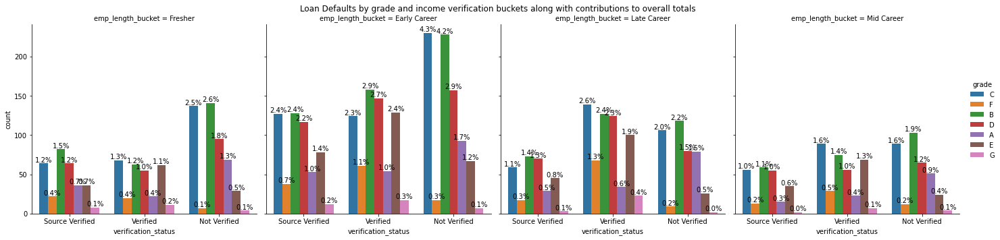

<Figure size 2160x1440 with 0 Axes>

In [83]:
#identify the ratio of defaulted loans by grade & employment length bucket
fg = sns.catplot(data=df_default, kind='count', x='verification_status', hue='grade', col='emp_length_bucket')
fg.fig.subplots_adjust(top=0.9)
fg.fig.suptitle('Loan Defaults by grade and income verification buckets along with contributions to overall totals')

for ax in fg.axes.ravel():
    
    for c in ax.containers:

        labels = [f'{h/df_default.loan_status.count()*100:0.1f}%' if (h := v.get_height()) > 0 else '' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')

plt.figure(figsize=(30,20))    
plt.show()

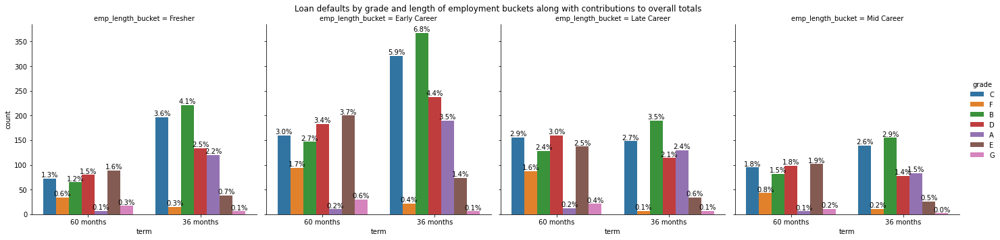

<Figure size 2160x1440 with 0 Axes>

In [84]:
#identify the ratio of defaulted loans by grade & employment length bucket
fg = sns.catplot(data=df_default, kind='count', x='term', hue='grade', col='emp_length_bucket')
fg.fig.subplots_adjust(top=0.9)
fg.fig.suptitle('Loan defaults by grade and length of employment buckets along with contributions to overall totals')

for ax in fg.axes.ravel():
    
    for c in ax.containers:

        labels = [f'{h/df_default.loan_status.count()*100:0.1f}%' if (h := v.get_height()) > 0 else '' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')

plt.figure(figsize=(30,20))        
plt.show()

In [85]:
df['annual_inc'].isnull().sum()

0

In [86]:
df['annual_inc'].describe()

count    3.864200e+04
mean     6.960828e+04
std      6.425320e+04
min      4.000000e+03
25%      4.140000e+04
50%      6.000000e+04
75%      8.319999e+04
max      6.000000e+06
Name: annual_inc, dtype: float64

<AxesSubplot:>

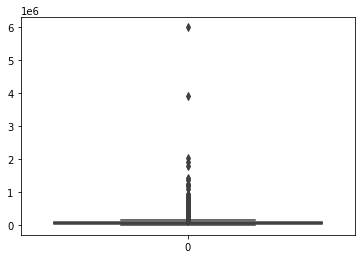

In [87]:
sns.boxplot(data=df['annual_inc'])

In [88]:
df[(df['annual_inc'] > 110000)].count()

index                    4376
id                       4376
member_id                4376
loan_amnt                4376
funded_amnt              4376
                         ... 
emp_length_bucket        4376
emp_length_new           4376
funded_amnt_inv_final    4376
term_bucket              4376
int_rate_bucket          4376
Length: 117, dtype: int64

## Impute the annual income for outliers

In [89]:
Q1 = df['annual_inc'].quantile(0.25)
Q3 = df['annual_inc'].quantile(0.75)
IQR = Q3 - Q1

# Filtering Values between Q1-1.5IQR and Q3+1.5IQR
df_income_filtered = df.query('(@Q1 - 1.5 * @IQR) <= annual_inc <= (@Q3 + 1.5 * @IQR)')

In [90]:
df_income_filtered.shape

(36818, 117)

<AxesSubplot:>

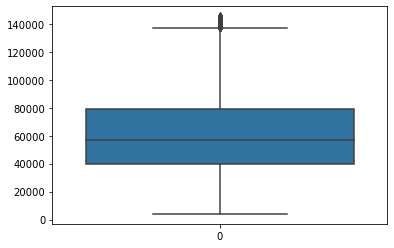

In [91]:
sns.boxplot(data=df_income_filtered['annual_inc'])

In [92]:
#First plot
tr0 = go.Bar(
    x = df_income_filtered[df_income_filtered["loan_status"]== 'Fully Paid']["sub_grade"].value_counts().index.values,
    y = df_income_filtered[df_income_filtered["loan_status"]== 'Fully Paid']["sub_grade"].value_counts().values,
    name='Loan Paid'
)

#First plot 2
tr1 = go.Bar(
    x = df_income_filtered[df_income_filtered["loan_status"]== 'Charged Off']["sub_grade"].value_counts().index.values,
    y = df_income_filtered[df_income_filtered["loan_status"]== 'Charged Off']["sub_grade"].value_counts().values,
    name="Loan Default"
)

#Second plot
tr2 = go.Box(
    x = df_income_filtered[df_income_filtered["loan_status"]== 'Fully Paid']["grade"],
    y = df_income_filtered[df_income_filtered["loan_status"]== 'Fully Paid']["annual_inc"],
    name=tr0.name
)

#Second plot 2
tr3 = go.Box(
    x = df_income_filtered[df_income_filtered["loan_status"]== 'Charged Off']["grade"],
    y = df_income_filtered[df_income_filtered["loan_status"]== 'Charged Off']["annual_inc"],
    name=tr1.name
)

data = [tr0, tr1, tr2,tr3]


fig = tls.make_subplots(rows=1, cols=2, 
                        subplot_titles=('Sub Grade', 'Annual Income by Grade'))

fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 1)
fig.append_trace(tr2, 1, 2)
fig.append_trace(tr3, 1, 2)

fig['layout'].update(height=600, width=960, title='Loan Status: Sub Grade Distribution & Range of Annual Incomes', boxmode='group')
py.iplot(fig, filename='gradeincome-subplot')

C:\Users\raman\anaconda3\lib\site-packages\plotly\tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [93]:
df_default_new = df_default.groupby(['issue_d'])['id'].count().sort_values(ascending=False)

In [94]:
df_default_new.head()

issue_d
Dec-11    408
Nov-11    314
Sep-11    292
Oct-11    290
May-11    275
Name: id, dtype: int64

## Assess the relationship between defaults and loan issue dates

<AxesSubplot:xlabel='issue_d'>

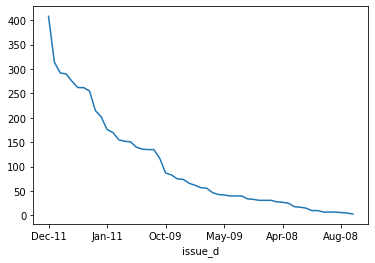

In [95]:
df_default_new.plot(x='issue_d')

<AxesSubplot:xlabel='issue_d'>

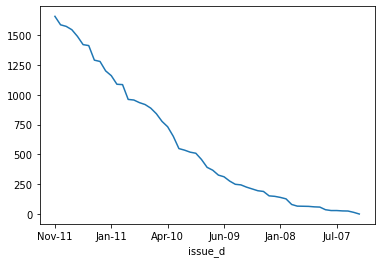

In [96]:
df_paid_new = df_paid.groupby(['issue_d'])['id'].count().sort_values(ascending=False)
df_paid_new.plot()